In [1]:
from __future__ import print_function, division

import thinkdsp
import thinkplot
import thinkstats2

import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

from ipywidgets import interact, interactive, fixed
import ipywidgets as widgets

%matplotlib inline

Exercise: ``A Soft Murmur'' is a web site that plays a mixture of natural noise sources, including rain, waves, wind, etc. At http://asoftmurmur.com/about/ you can find their list of recordings, most of which are at http://freesound.org.

Download a few of these files and compute the spectrum of each signal. Does the power spectrum look like white noise, pink noise, or Brownian noise? How does the spectrum vary over time?


In [2]:
import IPython.display as dp

url1= 'https://freesound.org/people/Soarer/sounds/13793/download/13793__soarer__north-sea.wav'
url2= 'https://freesound.org/people/OroborosNZ/sounds/141251/download/141251__oroborosnz__thunder-storm.aiff'
url2= 'https://freesound.org/people/soundman9826/sounds/193335/download/193335__soundman9826__rain-and-thunder.mp3'
url3= 'https://freesound.org/people/inchadney/sounds/56611/download/56611__inchadney__morning-in-the-country.wav'
url4= 'https://freesound.org/people/martypinso/sounds/22604/download/22604__martypinso__dmp010037-crickets-texas.wav'

dp.Audio(url= url1)



In [3]:
#wfn= '132736__ciccarelli__ocean-waves.wav'
wfn= 'north-sea.wav'
wave = thinkdsp.read_wave(wfn)
wave.make_audio()


In [4]:
segment = wave.segment(start= 10, duration=1.0)
segment.make_audio()

(10.0, 11)

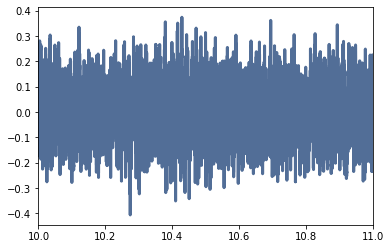

In [5]:
segment.plot()
import matplotlib.pyplot as pl
pl.xlim([10.0,11])

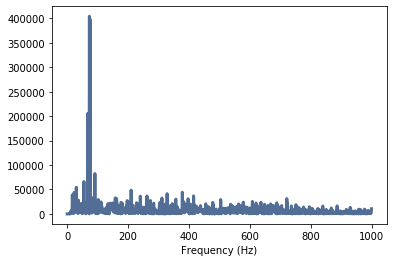

In [6]:
spectrum = segment.make_spectrum()
spectrum.plot_power(high=1000)
thinkplot.config(xlabel='Frequency (Hz)')

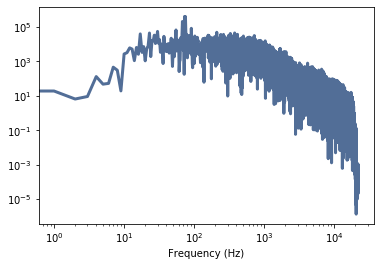

In [7]:
spectrum.plot_power()
thinkplot.config(xlabel='Frequency (Hz)',
                 xscale='log', 
                 yscale='log')

In [8]:
segment2 = wave.segment(start=20, duration=1.0)
segment2.make_audio()

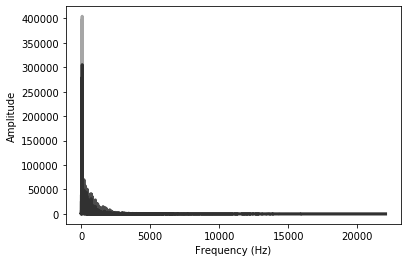

In [9]:
spectrum2 = segment2.make_spectrum()
spectrum.plot_power(color='grey')
spectrum2.plot_power(color='black')
thinkplot.config(xlabel='Frequency (Hz)',
                 ylabel='Amplitude')

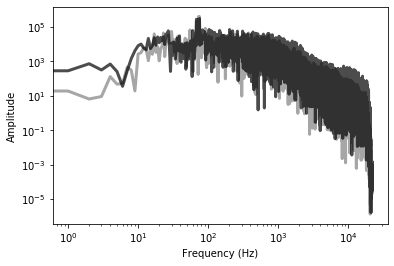

In [10]:
spectrum.plot_power(color='grey')
spectrum2.plot_power(color='black')
thinkplot.config(xlabel='Frequency (Hz)',
                 ylabel='Amplitude',
                 xscale='log', 
                 yscale='log')

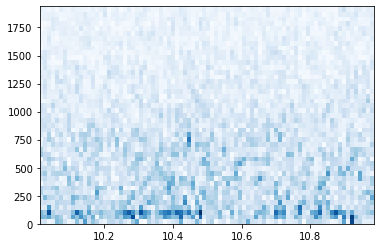

In [11]:
segment.make_spectrogram(1024).plot(high=2000)

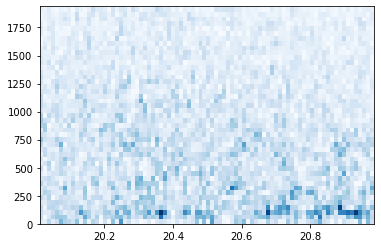

In [12]:
segment2.make_spectrogram(1024).plot(high=2000)

**Exercise:** In a noise signal, the mixture of frequencies changes over time.
In the long run, we expect the power at all frequencies to be equal,
but in any sample, the power at each frequency is random.

To estimate the long-term average power at each frequency, we can
break a long signal into segments, compute the power spectrum for each segment, and then compute the average across
the segments.  You can read more about this algorithm at
http://en.wikipedia.org/wiki/Bartlett's_method.

Bartlett’s method consists of the following steps:

0. The original N point data segment is split up into K (non-overlapping) data segments, each of length M
0. For each segment, compute the periodogram by computing the discrete Fourier transform (DFT version which does not divide by M), then computing the squared magnitude of the result and dividing this by M.
0. Average the result of the periodograms above for the K data segments.

    - The averaging reduces the variance, compared to the original N point data segment.
    - The end result is an array of power measurements vs. frequency "bin".
    
![](https://upload.wikimedia.org/wikipedia/commons/9/9e/Bartl.png)

Implement Bartlett's method and use it to estimate the power spectrum for a noise wave.

    Hint: look at the implementation of make_spectrogram.



In [14]:
def bartlett_method(wave, seg_length=512, win_flag=True):
    """Estimates the power spectrum of a noise wave.
    
    wave: Wave
    seg_length: segment length
    """
    # make a spectrogram and extract the spectrums
    spectro = wave.make_spectrogram(seg_length, win_flag)
    spectrums = spectro.spec_map.values()
    
    # extract the power array from each spectrum
    psds = [spectrum.power for spectrum in spectrums]
    
    # compute the root mean power (which is like an amplitude)
    hs = np.sqrt(sum(psds) / len(psds))
    
    fs = next(iter(spectrums)).fs 
    
    # make a Spectrum with the mean amplitudes
    spectrum = thinkdsp.Spectrum(hs, fs, wave.framerate)
    return spectrum

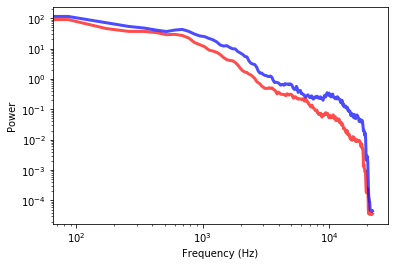

In [15]:
psd=  bartlett_method(segment)
psd2= bartlett_method(segment2)

psd.plot_power(color='red')
psd2.plot_power(color='blue')

thinkplot.config(xlabel='Frequency (Hz)', 
                 ylabel='Power', 
                 xscale='log', 
                 yscale='log')